# Vineyard
Experimenting with weighted vineyard distance formulations. Longer line length -> consistent feature -> lower D. Low distance to the diagonal -> unimportant -> lower distance.

In [1]:
import sklearn
from sklearn.datasets import fetch_openml
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import plotly
import plotly.graph_objects as go


/var/folders/fg/n7d57ft153bf46npr6w6jjxr0000gn/T/ipykernel_73121/3356440145.py:4: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
import gudhi
import gudhi.wasserstein
import gudhi.hera
import ot

In [82]:
INT_MAX = 2147483647

def persistence(array, dimension=None):
  height, width = array.shape
  cubeComplex = gudhi.CubicalComplex(
      dimensions = [width,height],
      top_dimensional_cells = 255 - array.flatten()
  )
 
  if dimension == None:
    persistence = cubeComplex.persistence()
  else:
    cubeComplex.compute_persistence()
    persistence = cubeComplex.persistence_intervals_in_dimension(dimension)
    
  return persistence

def stitch(PDs, ts):
    vines = [[0, None, [x,]] for x in range(len(PDs[0]))]
    ends = {x:x for x in range(len(PDs[0]))}
    
    for i in range(1, len(ts)):
        dist, match = gudhi.hera.wasserstein_distance(PDs[i-1], PDs[i], matching=True)
    
        baby = []
        # print("IIII", i)
    
        new_ends = {k:ends[k] for k in ends}
        for j, (x, y) in enumerate(match):
            # print(x,y)
            if x == -1:
                baby.append(j)
            elif y == -1: # end vines
                vines[ends[x]][1] = i
                vines[ends[x]][2].append(-1)
                # print(f"end {x} -> -1")
            else: # update vines
                vines[ends[x]][2].append(y)
                new_ends[y] = ends[x]
                # print(f"join {x} -> {y} (ind {ends[x]})")
        
        # new vines
        for j in baby:
            x, y = match[j]
            new_ends[y] = len(vines)
            vines.append([i, None, [y,]])
            # print(f"new {y} -> *")
    
        for k in [l for l in ends]: 
            if k >= len(PDs[i]):
                del new_ends[k]
    
        ends = new_ends

    return vines

def vineyard(f, g, nt=100, dim=0, verbose=False):
    ts = np.linspace(0, 1, nt)
    hs = np.array([t*f+(1-t)*g for t in ts]) 
    PD0 = [persistence(h, dimension=dim) for h in hs]
    vines = stitch(PD0, ts)

    poss = vines
    
    for i,_ in enumerate(vines):
        # print("II", i, vines[i])
        # print(i, vines[i][2], PD0[0][])
        repl = []
        for j,x in enumerate(vines[i][2]):
            if x == -1:
                # print(PD0[vines[i][0]+j-1][vines[i][2][j-1]], "xx")
                repl.append(np.mean(PD0[vines[i][0]+j-1][vines[i][2][j-1]])*np.ones((2,))) # proj prev
            else:
                repl.append(PD0[vines[i][0]+j][x])
    
        poss[i][2] = np.array(repl)
    
    res = [[[ts[p[0]+np.arange(len(p[2]))][i], *x] for i,x in enumerate(p[2])] for p in poss]

    mxs = [np.max(p[2]) for p in poss if np.inf not in p[2]]
    mx = np.max(mxs) if len(mxs) > 0 else INT_MAX

    if verbose:
        gudhi.plot_persistence_diagram(persistence(hs[len(ts)-1]))
        plt.show()
        gudhi.plot_persistence_diagram(persistence(hs[0]))
        plt.show()
        
        gos = []
        
        for vine in res:
            vine = np.minimum(np.array(vine), INT_MAX) # INTMAX for INF
            gos.append(go.Scatter3d(x=vine[:,0], y=vine[:,1], z=vine[:,2], marker=dict(
                size=2,
            ),
            line=dict(
                width=2
            )))
        
        xs = np.linspace(0, mx, 10)
        zs = np.linspace(0, 1, 10)
        xss, zss = np.meshgrid(xs, zs)
        gos.append(go.Surface(x=zss, y=xss, z=xss, colorscale=[[0, '#333'], [1, '#333']], opacity=0.1, showscale=False)) # x - y = 0: diag plane
        
        fig = go.Figure(data=gos)
        
        fig.update_layout(
            width=800,
            height=700,
            scene=dict(
              xaxis_title='T (homotopy)',
            zaxis=dict(range=[0,mx], title="Death"),
            yaxis=dict(range=[0,mx], title="Birth")
          ),

        )
        
        fig.show()

    return res

def vdist(vines, fD, fL): # diag weight func, length weight func
    V = 0

    for i in range(len(vines)):
        vines[i] = np.minimum(np.array(vines[i]), INT_MAX)
    
    for vine in vines:    
        v, L = 0, 0
        for i in range(1, len(vine)):
            l = np.linalg.norm(vine[i][1:]-vine[i-1][1:])
            dt = vine[i][0] - vine[i-1][0]
    
            mid = np.mean([vine[i][1:],vine[i-1][1:]], axis=0)
            proj = np.mean(mid)*np.ones(2,)
            D = np.linalg.norm(proj-mid)
            
            v += fD(D)*l*dt
            L += l*dt
    
        v *= fL(L)
        V += v

    return V

In [83]:
def gauss(c, sigma, shape):
    f = np.zeros(shape)
    for i in range(shape[0]):
        for j in range(shape[1]):
            f[i][j] = np.exp(-(np.linalg.norm(np.array([i, j])-np.array(c))/sigma)**2)

    return f

In [84]:
vines = vineyard(f, f, nt=100, dim=0, verbose=False)
vdist(vines, lambda D: D/100, lambda L: 1)

0.0

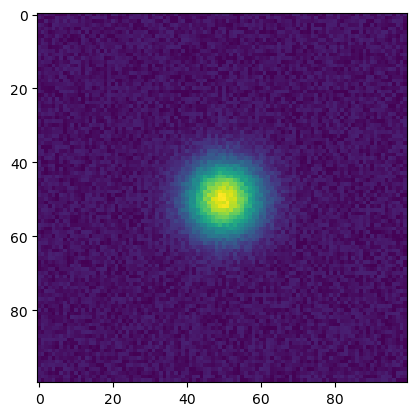

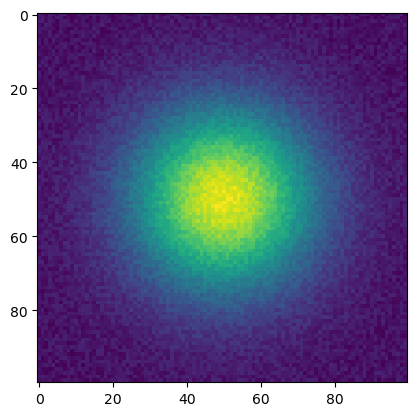

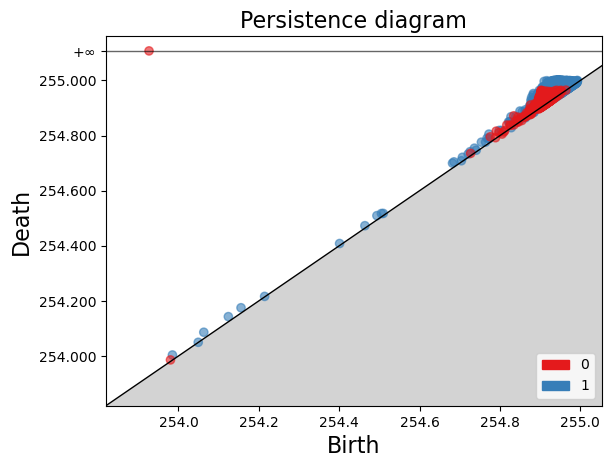

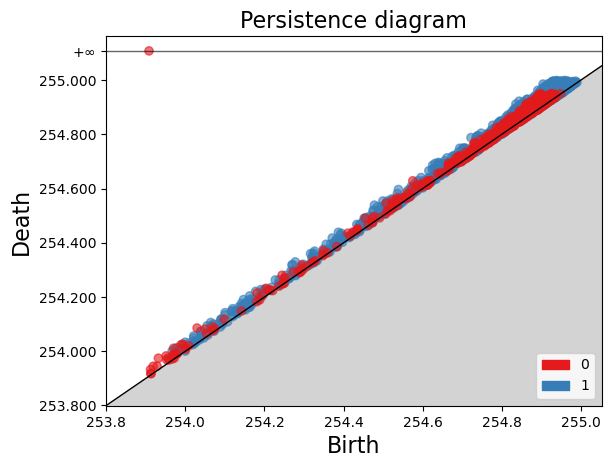

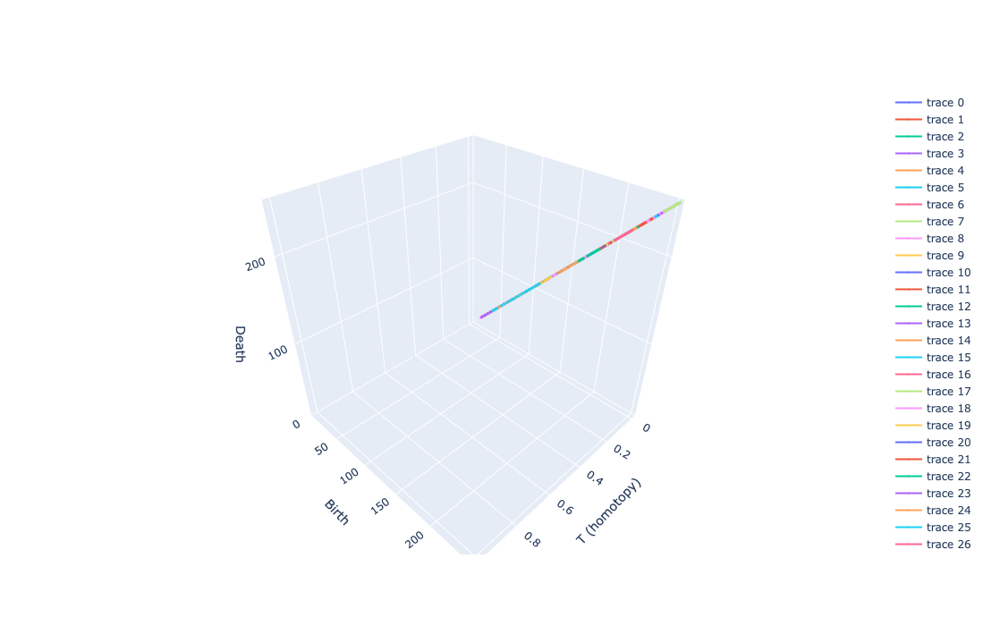

In [108]:
f = gauss((50,50), 10, (100,100)) + np.random.rand(100,100)*0.1
g = gauss((50,50), 25, (100,100)) + np.random.rand(100,100)*0.1
plt.imshow(f)
plt.show()
plt.imshow(g)
plt.show()
vines = vineyard(f, g, nt=100, dim=0, verbose=True)
d = vdist(vines, lambda D: D/100, lambda L: 1)

In [109]:
print(d)

6351.941656354074


In [110]:
f = gauss((20,20), 5, (40,40)) + np.random.rand(40,40)*0.1
xs = np.linspace(1, 20, 10)
ds = []
for x in xs:
    print(x)
    g = gauss((20,20), x, (40,40)) + np.random.rand(40,40)*0.1
    vines = vineyard(f, g, nt=100, dim=0, verbose=False)
    d = vdist(vines, lambda D: D/100, lambda L: 1)
    ds.append(d)

1.0
3.111111111111111
5.222222222222222
7.333333333333334
9.444444444444445
11.555555555555555
13.666666666666668
15.777777777777779
17.88888888888889
20.0


Text(0.5, 1.0, 'Vineyard v Distance (Gaussian)')

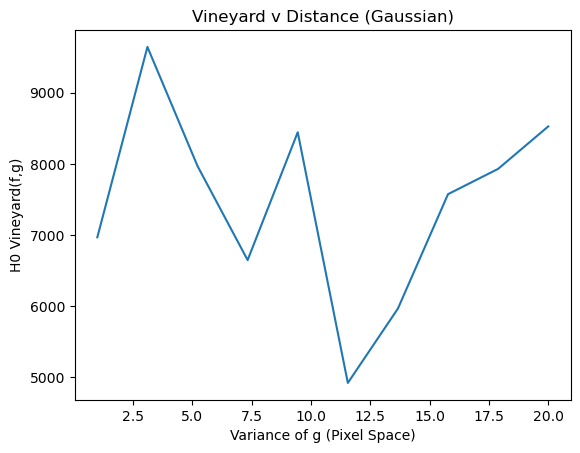

In [111]:
plt.plot(xs, ds)
plt.xlabel("Variance of g (Pixel Space)")
plt.ylabel("H0 Vineyard(f,g)")
plt.title("Vineyard v Distance (Gaussian)")